# Ансамбли алгоритмов для решения задачи регрессии

##### Практикум 317 группы, ММП ВМК МГУ

##### Автор: Овсиенко Олеся Павловна

##### Декабрь 2024

## Эксперименты

### 1) Предобработка данных

#### House Sales in King County, USA
##### Этот набор данных содержит цены на продажу домов. В него включены дома, проданные в период с мая 2014 по май 2015 года.

* id : обозначение для дома

* date: дата продажи дома

* price: прогнозируемая цена

* bedrooms: количество спален

* bathrooms: количество ванных комнат

* sqft_living: площадь дома

* sqft_lot: площадь участка

* floors : общее количество этажей (уровней) в доме

* waterfront : дом, из окон которого открывается вид на набережную

* view: был просмотрен

* condition : насколько хорошее состояние в целом

* grade: общая оценка, присвоенная жилью в соответствии с системой оценки King County

* sqft_above : площадь дома без учета подвала

* sqft_basement:  площадь подвала

* yr_built : год постройки

* yr_renovated : год, когда дом был отремонтирован

* zipcode: почтовый индекс

* lat: координаты по широте

* long: координаты по долготе

* sqft_living15 

* sqft_lot15 

In [1]:
!pip install pandas

In [2]:
import pandas as pd

In [3]:
!pip install numpy

In [4]:
import numpy.typing as npt

In [5]:
import numpy as np

In [493]:
data = pd.read_csv("kc_house_data.csv")

In [7]:
!pip install scikit-learn

In [332]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [333]:
data.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

In [334]:
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [435]:
# data.drop('id', axis = 1, inplace = True)
# data.describe()

In [437]:
feature = ['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']

len(feature)

21

In [438]:
for f in feature:
    print(f"number of NaN values for the column bedrooms {f} :", data[f].isnull().sum())

number of NaN values for the column bedrooms id : 0
number of NaN values for the column bedrooms date : 0
number of NaN values for the column bedrooms price : 0
number of NaN values for the column bedrooms bedrooms : 0
number of NaN values for the column bedrooms bathrooms : 0
number of NaN values for the column bedrooms sqft_living : 0
number of NaN values for the column bedrooms sqft_lot : 0
number of NaN values for the column bedrooms floors : 0
number of NaN values for the column bedrooms waterfront : 0
number of NaN values for the column bedrooms view : 0
number of NaN values for the column bedrooms condition : 0
number of NaN values for the column bedrooms grade : 0
number of NaN values for the column bedrooms sqft_above : 0
number of NaN values for the column bedrooms sqft_basement : 0
number of NaN values for the column bedrooms yr_built : 0
number of NaN values for the column bedrooms yr_renovated : 0
number of NaN values for the column bedrooms zipcode : 0
number of NaN value

In [439]:
import pandas as pd
import matplotlib.pyplot as plt

data['date'] = pd.to_datetime(data['date'], format='%Y%m%dT%H%M%S')

data['year'] = data['date'].dt.year
data['month'] = data['date'].dt.month
data['day'] = data['date'].dt.day
data['weekday'] = data['date'].dt.weekday 

plt.figure(figsize=(10,6))
plt.scatter(data['month'], data['price'], alpha=0.5)
plt.title('Зависимость цены от месяца', fontsize=14)
plt.xlabel('Месяц', fontsize=12)
plt.ylabel('Цена', fontsize=12)
plt.grid(True)
plt.show()

plt.figure(figsize=(10,6))
plt.scatter(data['weekday'], data['price'], alpha=0.5)
plt.title('Зависимость цены от дня недели', fontsize=14)
plt.xlabel('День недели', fontsize=12)
plt.ylabel('Цена', fontsize=12)
plt.grid(True)
plt.show()

correlation = data[['year', 'price']].corr()
print(correlation)


           year     price
year   1.000000  0.003576
price  0.003576  1.000000


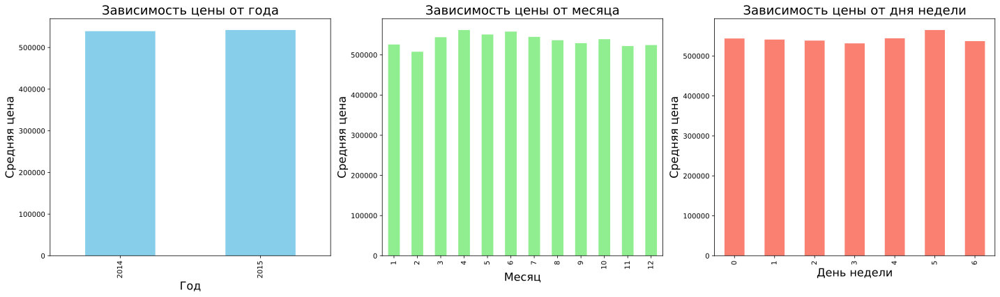

In [494]:
import pandas as pd
import matplotlib.pyplot as plt

data['date'] = pd.to_datetime(data['date'], format='%Y%m%dT%H%M%S')

data['year'] = data['date'].dt.year
data['month'] = data['date'].dt.month
data['day'] = data['date'].dt.day
data['weekday'] = data['date'].dt.weekday  
data.drop('day', axis = 1, inplace = True)

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

data.groupby('year')['price'].mean().plot(kind='bar', ax=axes[0], color='skyblue')
axes[0].set_title('Зависимость цены от года', fontsize=18)
axes[0].set_xlabel('Год', fontsize=16)
axes[0].set_ylabel('Средняя цена', fontsize=16)

data.groupby('month')['price'].mean().plot(kind='bar', ax=axes[1], color='lightgreen')
axes[1].set_title('Зависимость цены от месяца', fontsize=18)
axes[1].set_xlabel('Месяц', fontsize=16)
axes[1].set_ylabel('Средняя цена', fontsize=16)

data.groupby('weekday')['price'].mean().plot(kind='bar', ax=axes[2], color='salmon')
axes[2].set_title('Зависимость цены от дня недели', fontsize=18)
axes[2].set_xlabel('День недели', fontsize=16)
axes[2].set_ylabel('Средняя цена', fontsize=16)


plt.tight_layout()
plt.savefig('time.pdf', format='pdf')
plt.show()


In [441]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,weekday
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,0
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,1
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,1
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,2


In [442]:
y = data['floors'].value_counts().to_frame()
y

,count
floors,
1.0,10680
2.0,8241
1.5,1910
3.0,613
2.5,161
3.5,8


Используем функцию boxplot в библиотеке seaborn, чтобы определить, какие дома с видом на набережную или без него имеют больше ценовых отклонений.

In [16]:
import matplotlib.pyplot as plt

%matplotlib inline

In [17]:
import seaborn as sns

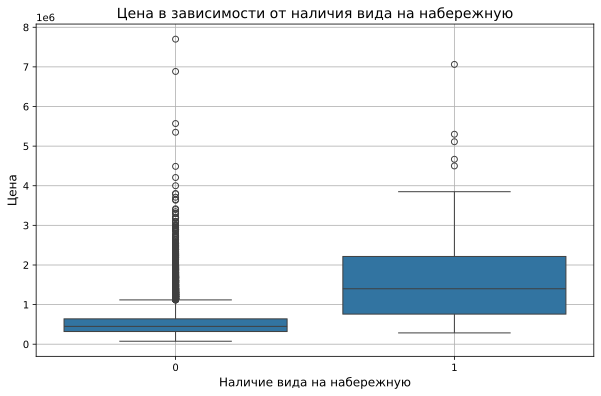

In [443]:
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'waterfront',  y = 'price', data = data)

plt.title('Цена в зависимости от наличия вида на набережную', fontsize=14)
plt.xlabel('Наличие вида на набережную', fontsize=12)
plt.ylabel('Цена', fontsize=12)
plt.grid(True)
plt.savefig("waterfront.pdf", format='pdf')
plt.show()

In [444]:
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,weekday
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,0
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,1
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,1
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,2


In [495]:
data.drop('date', axis = 1, inplace = True)

In [446]:
data.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,weekday
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,...,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,0
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,...,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,1
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,...,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,2
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,...,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,1
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,...,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,2


In [447]:
data.corr()['price'].sort_values()

zipcode         -0.053203
id              -0.016762
month           -0.010081
weekday         -0.001695
year             0.003576
long             0.021626
condition        0.036362
yr_built         0.054012
sqft_lot15       0.082447
sqft_lot         0.089661
yr_renovated     0.126434
floors           0.256794
waterfront       0.266369
lat              0.307003
bedrooms         0.308350
sqft_basement    0.323816
view             0.397293
bathrooms        0.525138
sqft_living15    0.585379
sqft_above       0.605567
grade            0.667434
sqft_living      0.702035
price            1.000000
Name: price, dtype: float64

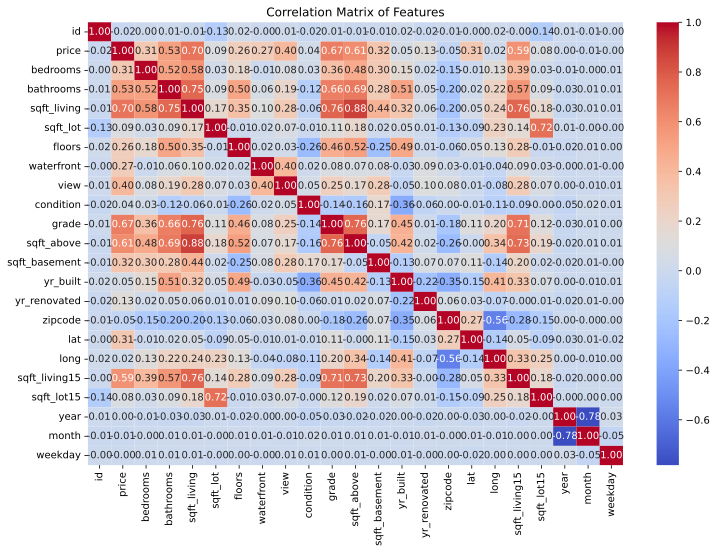

In [448]:
correlation_matrix = data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Features')
plt.savefig('correlatio.pdf', format='pdf')
plt.show()

In [449]:
correlation_matrix

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,weekday
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,...,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798,0.010128,-0.011708,-0.000407
price,-0.016762,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,...,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447,0.003576,-0.010081,-0.001695
bedrooms,0.001286,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,...,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244,-0.009838,-0.001533,0.009843
bathrooms,0.005160,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,...,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175,-0.026596,0.007392,0.010504
sqft_living,-0.012258,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,...,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286,-0.029038,0.011810,0.005152
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,...,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557,0.005468,-0.002369,-0.002758
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,...,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269,-0.022315,0.014005,0.002453
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,...,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703,-0.004165,0.008132,-0.004668
view,0.011592,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,...,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575,0.001364,-0.005638,0.006186
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,...,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406,-0.045589,0.021978,0.007011


/var/folders/vr/f4n73_7s7bq4rmxq65ctsz0h0000gn/T/ipykernel_69896/3817429134.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  plot = sns.barplot(y=correlations.index, x=correlations, palette=colors)


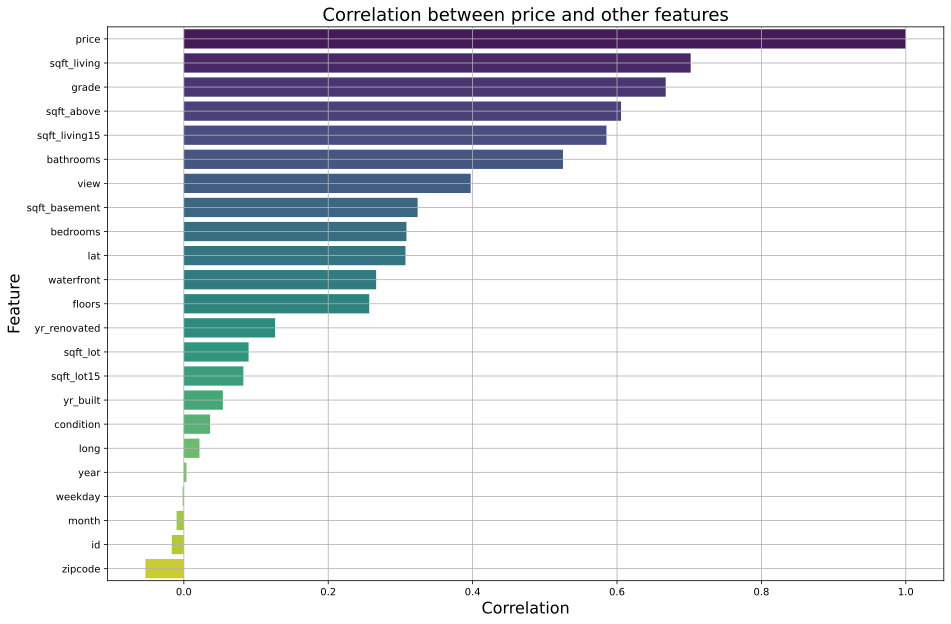

In [484]:
correlations = data.corrwith(data['price']).sort_values(ascending=False)

colors = sns.color_palette("viridis", len(correlations)) 

plot = sns.barplot(y=correlations.index, x=correlations, palette=colors)

plt.title('Correlation between price and other features', fontsize=18)
plot.figure.set_size_inches(15, 10)
plt.xlabel('Correlation', fontsize=16)
plt.ylabel('Feature', fontsize=16)
plot.grid(True)

plt.savefig('barplot.pdf', format='pdf')


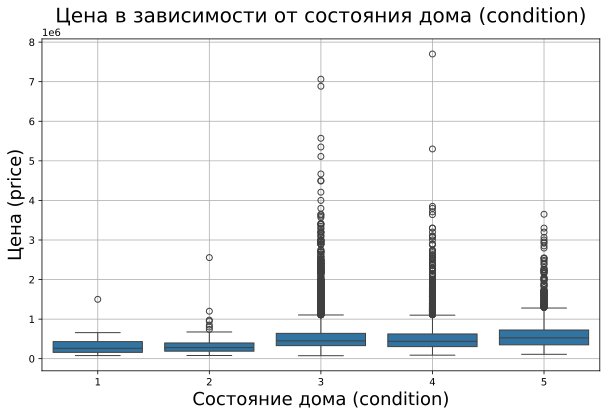

In [485]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='condition', y='price', data=data)

plt.title('Цена в зависимости от состояния дома (condition)', fontsize=20)
plt.xlabel('Состояние дома (condition)', fontsize=18)
plt.ylabel('Цена (price)', fontsize=18)
plt.grid(True)
plt.savefig('condition.pdf', format='pdf')
plt.show()


In [27]:
!pip3 install folium

In [452]:
zipcodes = data["zipcode"].unique()
print(len(zipcodes))

70


In [453]:
import folium
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, to_hex
import matplotlib.cm as cm

def get_color_by_zipcode(zipcode, unique_zipcodes, colormap):
    """Возвращает цвет на основе zipcode"""

    zipcode_index = list(unique_zipcodes).index(zipcode)
    norm = Normalize(vmin=0, vmax=len(unique_zipcodes) - 1)  
    rgba = colormap(norm(zipcode_index))  
    return to_hex(rgba)  

def show_circles_on_map(data, latitude_column, longitude_column, zipcode_column):
    """
    Функция рисует карту с кругами, цвет которых зависит от zipcode.

    data: DataFrame, содержащий колонки latitude_column, longitude_column и zipcode_column
    latitude_column: string, название колонки с широтой
    longitude_column: string, название колонки с долготой
    zipcode_column: string, название колонки с Zipcode
    """
 
    unique_zipcodes = data[zipcode_column].unique()
    

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location, zoom_start=10)


    colormap = cm.plasma 

    for _, row in data.iterrows():
        zipcode = row[zipcode_column]
        color = get_color_by_zipcode(zipcode, unique_zipcodes, colormap)

        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

m = show_circles_on_map(data.sample(15000), "lat", "long", "zipcode")
m.save("map_by_zipcode.html") 


In [454]:
m

In [455]:

zipcode_stats = data.groupby('zipcode')['price'].agg(['mean', 'median', 'min', 'max', 'std'])
zipcode_stats.sort_values('mean', ascending=False, inplace=True) 
print(zipcode_stats)

                 mean     median       min        max           std
zipcode                                                            
98039    2.160607e+06  1892500.0  787500.0  6885000.0  1.166477e+06
98004    1.355927e+06  1150000.0  425000.0  7062500.0  7.458201e+05
98040    1.194230e+06   993750.0  500000.0  5300000.0  6.074935e+05
98112    1.095499e+06   915000.0  169317.0  3400000.0  5.937596e+05
98102    9.012583e+05   720000.0  330000.0  7700000.0  7.866621e+05
...               ...        ...       ...        ...           ...
98148    2.849086e+05   278000.0  105500.0   600600.0  8.961694e+04
98001    2.808047e+05   260000.0  100000.0   850000.0  9.897923e+04
98032    2.512962e+05   249000.0   85000.0   545000.0  6.470543e+04
98168    2.403284e+05   235000.0   78000.0   600000.0  6.998482e+04
98002    2.342840e+05   235000.0   95000.0   389000.0  5.204145e+04

[70 rows x 5 columns]


/var/folders/vr/f4n73_7s7bq4rmxq65ctsz0h0000gn/T/ipykernel_69896/3893621597.py:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='zipcode', y='price', data=zipcode_price_sorted, ci=None, order=zipcode_price_sorted['zipcode'])


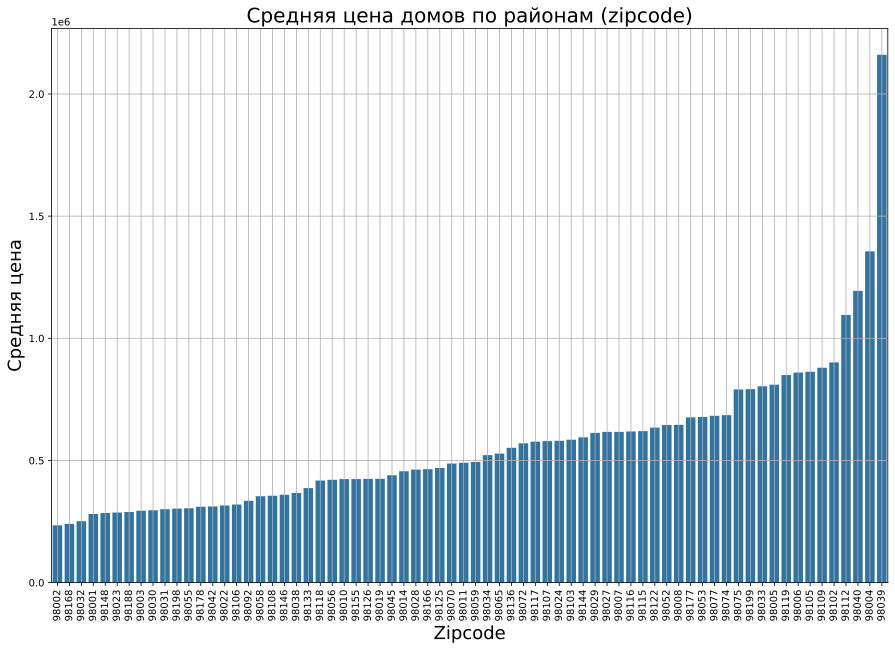

In [487]:
import matplotlib.pyplot as plt
import seaborn as sns

zipcode_price = data.groupby('zipcode')['price'].mean().reset_index()

zipcode_price_sorted = zipcode_price.sort_values(by='price', ascending=True)

plt.figure(figsize=(15, 10))
sns.barplot(x='zipcode', y='price', data=zipcode_price_sorted, ci=None, order=zipcode_price_sorted['zipcode'])
plt.xticks(rotation=90)
plt.title('Средняя цена домов по районам (zipcode)', fontsize=20)
plt.xlabel('Zipcode', fontsize=18)
plt.ylabel('Средняя цена', fontsize=18)
plt.grid(True)
plt.savefig("zipcode.pdf", format='pdf')
plt.show()


In [496]:
data = data.drop(columns=['id', 'sqft_above', 'long', 'year', 'weekday', 'month'])

In [458]:
data.nunique()

price            4028
bedrooms           13
bathrooms          30
sqft_living      1038
sqft_lot         9782
floors              6
waterfront          2
view                5
condition           5
grade              12
sqft_basement     306
yr_built          116
yr_renovated       70
zipcode            70
lat              5034
sqft_living15     777
sqft_lot15       8689
dtype: int64

In [497]:
categorial_features = ['waterfront', 'floors', 'view', 'condition', 'grade', 'zipcode']
numerical_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'sqft_living15', 'sqft_lot15']


### 2) Random Forest

In [498]:
y = data["price"]
X = data.drop(columns=['price'])

In [499]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)

In [500]:
from sklearn.preprocessing import TargetEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
prepocess = ColumnTransformer([('scaler', StandardScaler(), numerical_features), ('encoder', TargetEncoder(target_type='continuous'), categorial_features)])
X_train_prep = prepocess.fit_transform(X_train, y_train)
X_test_prep = prepocess.transform(X_test)

In [502]:
from typing import TypedDict

import numpy as np
import numpy.typing as npt


class ConvergenceHistory(TypedDict):
    """
    TypedDict to store the convergence history of training and validation losses.

    Attributes
    ----------
    train : list[float]
        A list of training losses over epochs.
    val : list[float] | None, optional
        A list of validation losses over epochs. Defaults to None.
    """

    train: list[float]
    val: list[float] | None = None


def rmsle(y: npt.NDArray[np.float64],
          z: npt.NDArray[np.float64]) -> np.float64:
    """
    Calculate the Root Mean Squared Logarithmic Error (RMSLE) between two arrays.

    RMSLE is a metric that is often used in regression problems where the target variable
    is continuous and non-negative. It is particularly useful when the target variable
    spans several orders of magnitude.

    Args
    ----
    y : npt.NDArray[np.float64]
        The true values.
    z : npt.NDArray[np.float64]
        The predicted values.

    Returns
    -------
    float
        The RMSLE value.
    """
    res = np.sqrt(np.mean((np.log1p(y) - np.log1p(z)) ** 2))
    return float(res)

def rmse(y_true: np.ndarray, y_pred: np.ndarray) -> float:
    """
    Calculate the Root Mean Squared Error (RMSE).

    Args:
        y_true (np.ndarray): True labels.
        y_pred (np.ndarray): Predicted labels.

    Returns:
        float: RMSE value.
    """
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

def whether_to_stop(convergence_history: ConvergenceHistory,
                    patience: int) -> bool:
    """
    Determine whether to stop training based on the convergence history.

    This function checks if the training or validation loss has not improved for a
    specified number of epochs (patience). If the validation loss history is provided,
    it is used for the decision; otherwise, the training loss history is used.

    Args
    ----
    convergence_history : ConvergenceHistory
        A dictionary containing the training loss history and optionally the validation
        loss history.
    patience : int
        The number of epochs to wait after the last time the loss improved before
        stopping the training.

    Returns
    -------
    bool
        True if training should be stopped, False otherwise.

    Raises
    ------
    KeyError
        If neither 'train' nor 'val' key is present in the convergence_history.
    """
    if 'val' in convergence_history and convergence_history['val'] is not None:
        losses = convergence_history['val']
    elif 'train' in convergence_history:
        losses = convergence_history['train']
    else:
        raise KeyError("Convergence history must contain 'train' or 'val' key.")

    if len(losses) < patience + 1:
        return False

    min_loss = min(losses)
    for epoch in range(-patience, 0):
        if losses[epoch] < min_loss:
            return False

    return True


In [472]:
import json
from pathlib import Path
from typing import Any

import joblib
import numpy as np
import numpy.typing as npt
from sklearn.tree import DecisionTreeRegressor

class RandomForestMSE:
    def __init__(
        self,
        n_estimators: int,
        tree_params: dict[str, Any] | None = None
    ) -> None:
        self.n_estimators = n_estimators
        if tree_params is None:
            tree_params = {}
        if tree_params.get("max_features") is None:
            tree_params["max_features"] = 1 / 3
        self.tree_params = tree_params
        self.forest = [DecisionTreeRegressor(**tree_params) for _ in range(n_estimators)]

    def fit(
        self,
        X: npt.NDArray[np.float64],
        y: npt.NDArray[np.float64],
        X_val: npt.NDArray[np.float64] | None = None,
        y_val: npt.NDArray[np.float64] | None = None,
        trace: bool | None = None,
        patience: int | None = None,
    ) -> ConvergenceHistory | None:
        
        if isinstance(X, pd.DataFrame):
            X = X.values
        if isinstance(y, pd.Series):
            y = y.values
        if X_val is not None and isinstance(X_val, pd.DataFrame):
            X_val = X_val.values
        if y_val is not None and isinstance(y_val, pd.Series):
            y_val = y_val.values

        if trace is None:
            trace = X_val is not None and y_val is not None

        history = {'train': [], 'val': []} if trace else None

        for i in range(self.n_estimators):
            indices = np.random.choice(X.shape[0], X.shape[0], replace=True)
            X_bootstrap = X[indices]
            y_bootstrap = y[indices]

            tree = self.forest[i]
            
            tree.fit(X_bootstrap, y_bootstrap)

            if trace:
                train_pred = self.predict(X, i)
                train_loss = rmse(y, train_pred)
                history['train'].append(train_loss)

                if X_val is not None and y_val is not None:
                    val_pred = self.predict(X_val, i)
                    val_loss = rmse(y_val, val_pred)
                    history['val'].append(val_loss)

                    if patience is not None and whether_to_stop(history, patience):
                        break

        return history

    def predict(self, X: np.ndarray, n: int | None) -> np.ndarray:
        if n is None:
            n = self.n_estimators
            
        predictions = np.zeros((self.n_estimators, X.shape[0]))

        for i, tree in enumerate(self.forest[:n+1]):
            predictions[i] = tree.predict(X)

        return np.mean(predictions, axis=0)
    

    def dump(self, dirpath: str) -> None:
        """
        Save the trained model to the specified directory.

        Args:
            dirpath (str): Path to the directory where the model will be saved.
        """
        path = Path(dirpath)
        path.mkdir(parents=True)

        params = {"n_estimators": self.n_estimators}
        with (path / "params.json").open("w") as file:
            json.dump(params, file, indent=4)

        trees_path = path / "trees"
        trees_path.mkdir()
        for i, tree in enumerate(self.forest):
            joblib.dump(tree, trees_path / f"tree_{i:04d}.joblib")


    @classmethod
    def load(cls, dirpath: str) -> "RandomForestMSE":
        """
        Load a trained model from the specified directory.

        Args:
            dirpath (str): Path to the directory where the model is saved.

        Returns:
            RandomForestMSE: An instance of the loaded model.
        """
        with (Path(dirpath) / "params.json").open() as file:
            params = json.load(file)
        instance = cls(params["n_estimators"])

        trees_path = Path(dirpath) / "trees"

        instance.forest = [
            joblib.load(trees_path / f"tree_{i:04d}.joblib")
            for i in range(params["n_estimators"])
        ]

        return instance

Эксперимент 1: Количество деревьев 
 Минимальное RMSE = 149337.757 при времени обучения = 22.909 было достигнуто при 200 деревьях


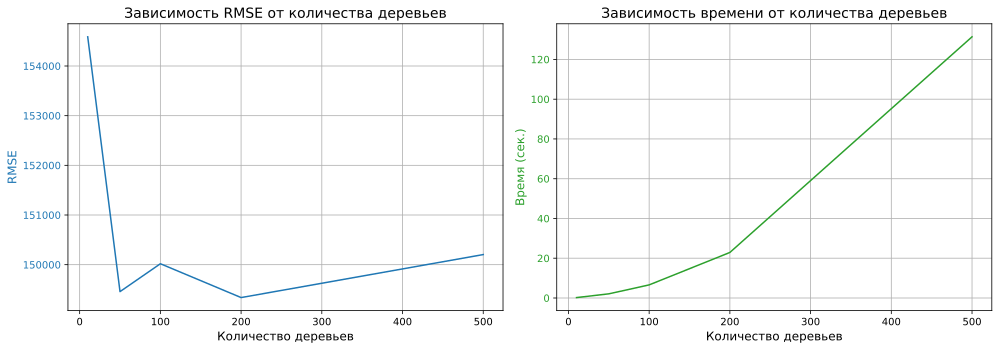

Эксперимент 2: Размерность подвыборки признаков 
 Минимальное RMSE = 144897.768 при времени обучения = 8.365 было достигнуто при подвыборке признаков = 0.7 всех признаков


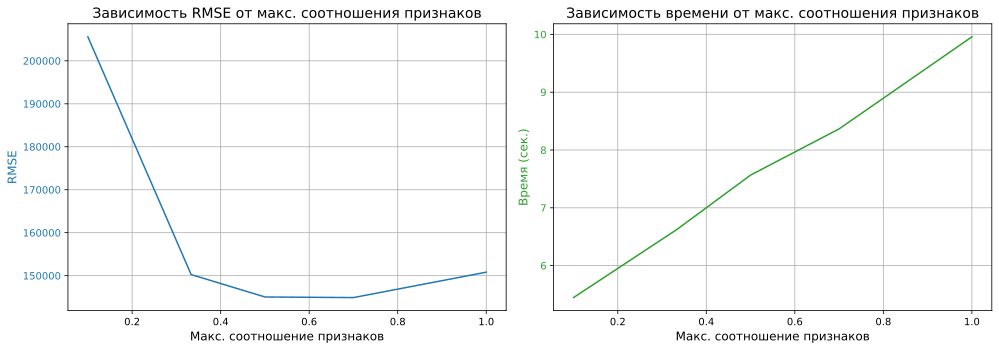

Эксперимент 3: Максимальная глубина дерева 

      Минимальное RMSE = 114198.94 при времени обучения = 26.548 было достигнуто при максимальной глубине дерева = 20 
 
      В случае, когда глубина не ограничена, RMSE = 115167.868 при времени обучения = 115167.868


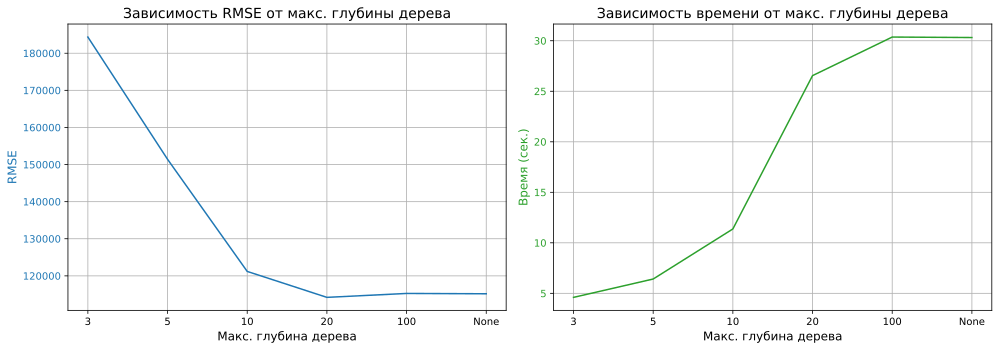

In [473]:
import time
import matplotlib.pyplot as plt
from utils import rmse

def evaluate_model(n_estimators, max_features, max_depth, X_train, y_train, X_val, y_val):
    model = RandomForestMSE(
        n_estimators=n_estimators,
        tree_params={'max_depth': max_depth, 'max_features': max_features}
    )

    start_time = time.time()
    model.fit(X_train, y_train, X_val, y_val)
    end_time = time.time()

    predictions = model.predict(X_val, None)
    rmse_val = rmse(y_val, predictions)

    return rmse_val, end_time - start_time

# Эксперимент 1: Количество деревьев
n_estimators_list = [10, 50, 100, 200, 500]
rmse_values_n_estimators = []
times_n_estimators = []

for n_estimators in n_estimators_list:
    rmse_val, elapsed_time = evaluate_model(n_estimators, 1/3, 5, X_train_prep, y_train, X_test_prep, y_test)
    rmse_values_n_estimators.append(rmse_val)
    times_n_estimators.append(elapsed_time)

min_rmse = min(rmse_values_n_estimators)
index_min = rmse_values_n_estimators.index(min_rmse)
time_min = times_n_estimators[index_min]
best_res = n_estimators_list[index_min]

print(f"Эксперимент 1: Количество деревьев \n Минимальное RMSE = {round(min_rmse, 3)} при времени обучения = {round(time_min, 3)} было достигнуто при {best_res} деревьях")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.set_xlabel('Количество деревьев', fontsize=12)
ax1.set_ylabel('RMSE', color='tab:blue', fontsize=12)
ax1.plot(n_estimators_list, rmse_values_n_estimators, color='tab:blue', label='RMSE')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_title('Зависимость RMSE от количества деревьев', fontsize=14)
ax1.grid(True)

ax2.set_xlabel('Количество деревьев', fontsize=12)
ax2.set_ylabel('Время (сек.)', color='tab:green', fontsize=12)
ax2.plot(n_estimators_list, times_n_estimators, color='tab:green', label='Время')
ax2.tick_params(axis='y', labelcolor='tab:green')
ax2.set_title('Зависимость времени от количества деревьев', fontsize=14)
ax2.grid(True)

fig.tight_layout()
plt.savefig('2-1.pdf', format = 'pdf')
plt.show()

# Эксперимент 2: Размерность подвыборки признаков
max_features_ratios = [1/10, 1/3, 1/2, 7/10, 1.0]
rmse_values_max_features = []
times_max_features = []

for ratio in max_features_ratios:
    rmse_val, elapsed_time = evaluate_model(100, ratio, 5, X_train_prep, y_train, X_test_prep, y_test)
    rmse_values_max_features.append(rmse_val)
    times_max_features.append(elapsed_time)

min_rmse = min(rmse_values_max_features)
index_min = rmse_values_max_features.index(min_rmse)
time_min = times_max_features[index_min]
best_res = max_features_ratios[index_min]

print(f"Эксперимент 2: Размерность подвыборки признаков \n Минимальное RMSE = {round(min_rmse, 3)} при времени обучения = {round(time_min, 3)} было достигнуто при подвыборке признаков = {best_res} всех признаков")


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.set_xlabel('Макс. соотношение признаков', fontsize=12)
ax1.set_ylabel('RMSE', color='tab:blue', fontsize=12)
ax1.plot(max_features_ratios, rmse_values_max_features, color='tab:blue', label='RMSE')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_title('Зависимость RMSE от макс. соотношения признаков', fontsize=14)
ax1.grid(True)

ax2.set_xlabel('Макс. соотношение признаков', fontsize=12)
ax2.set_ylabel('Время (сек.)', color='tab:green', fontsize=12)
ax2.plot(max_features_ratios, times_max_features, color='tab:green', label='Время')
ax2.tick_params(axis='y', labelcolor='tab:green')
ax2.set_title('Зависимость времени от макс. соотношения признаков', fontsize=14)
ax2.grid(True)

fig.tight_layout()
plt.savefig('2-2.pdf', format='pdf')
plt.show()

# Эксперимент 3: Максимальная глубина дерева
max_depth_list = [3, 5, 10, 20, 100, None]
rmse_values_max_depth = []
times_max_depth = []

for max_depth in max_depth_list:
    rmse_val, elapsed_time = evaluate_model(100, 1/3, max_depth, X_train_prep, y_train, X_test_prep, y_test)
    rmse_values_max_depth.append(rmse_val)
    times_max_depth.append(elapsed_time)

min_rmse = min(rmse_values_max_depth)
index_min = rmse_values_max_depth.index(min_rmse)
time_min = times_max_depth[index_min]
best_res = max_depth_list[index_min]
none_res_rmse = rmse_values_max_depth[-1]
none_res_time = rmse_values_max_depth[-1]

print(f'''Эксперимент 3: Максимальная глубина дерева \n
      Минимальное RMSE = {round(min_rmse, 3)} при времени обучения = {round(time_min, 3)} было достигнуто при максимальной глубине дерева = {best_res} \n 
      В случае, когда глубина не ограничена, RMSE = {round(none_res_rmse, 3)} при времени обучения = {round(none_res_time, 3)}''')

max_depth_labels = [str(depth) if depth is not None else "None" for depth in max_depth_list]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.set_xlabel('Макс. глубина дерева', fontsize=12)
ax1.set_ylabel('RMSE', color='tab:blue', fontsize=12)
ax1.plot(max_depth_labels, rmse_values_max_depth, color='tab:blue', label='RMSE')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.set_title('Зависимость RMSE от макс. глубины дерева', fontsize=14)
ax1.grid(True)

ax2.set_xlabel('Макс. глубина дерева', fontsize=12)
ax2.set_ylabel('Время (сек.)', color='tab:green', fontsize=12)
ax2.plot(max_depth_labels, times_max_depth, color='tab:green', label='Время')
ax2.tick_params(axis='y', labelcolor='tab:green')
ax2.set_title('Зависимость времени от макс. глубины дерева', fontsize=14)
ax2.grid(True)

fig.tight_layout()
plt.savefig('2-3.pdf', format='pdf')
plt.show()

### 3) Gradient Boosting

In [503]:
import json
from pathlib import Path
from typing import Any

import joblib
import numpy as np
import numpy.typing as npt
from sklearn.tree import DecisionTreeRegressor

class GradientBoostingMSE:
    const_prediction: float

    def __init__(
        self,
        n_estimators: int,
        tree_params: dict[str, Any] | None = None,
        learning_rate=0.1,
    ) -> None:
        self.n_estimators = n_estimators
        self.learning_rate = learning_rate
        if tree_params is None:
            tree_params = {}
        if tree_params.get("max_features") is None:
            tree_params["max_features"] = 1 / 3
        self.tree_params = tree_params
        self.forest = [
            DecisionTreeRegressor(**tree_params) for _ in range(n_estimators)
        ]
        
    def fit(
        self,
        X: npt.NDArray[np.float64],
        y: npt.NDArray[np.float64],
        X_val: npt.NDArray[np.float64] | None = None,
        y_val: npt.NDArray[np.float64] | None = None,
        trace: bool | None = None,
        patience: int | None = None,
    ) -> ConvergenceHistory | None:

        if isinstance(X, pd.DataFrame):
            X = X.values
        if isinstance(y, pd.Series):
            y = y.values
        if X_val is not None and isinstance(X_val, pd.DataFrame):
            X_val = X_val.values
        if y_val is not None and isinstance(y_val, pd.Series):
            y_val = y_val.values

        if trace is None:
            trace = X_val is not None and y_val is not None

        history = {'train': [], 'val': []} if trace else None

        y_pred = np.zeros_like(y)

        for i in range(self.n_estimators):
            residuals = y - y_pred

            indices = np.random.choice(X.shape[0], X.shape[0], replace=True)
            X_bootstrap = X[indices]
            residuals_bootstrap = residuals[indices]

            tree = self.forest[i]
         
            tree.fit(X_bootstrap, residuals_bootstrap)

            y_pred += self.learning_rate * tree.predict(X)

            if trace:
                train_loss = rmse(y, y_pred)
                history['train'].append(train_loss)

                if X_val is not None and y_val is not None:
                    val_pred = self.predict(X_val, i)
                    val_loss = rmse(y_val, val_pred)
                    history['val'].append(val_loss)

                    if patience is not None and whether_to_stop(history, patience):
                        break

        return history

    def predict(self, X: np.ndarray, n: int | None) -> np.ndarray:
        if n is None:
            n = self.n_estimators
        y_pred = np.zeros(X.shape[0])
        for tree in self.forest[:n+1]:
            y_pred += self.learning_rate * tree.predict(X)
        return y_pred

    def dump(self, dirpath: str) -> None:
        """
        Saves the model to the specified directory.

        Args:
            dirpath (str): Path to the directory where the model will be saved.
        """
        path = Path(dirpath)
        path.mkdir(parents=True)

        params = {
            "n_estimators": self.n_estimators,
            "learning_rate": self.learning_rate,
            "const_prediction": self.const_prediction,
        }
        with (path / "params.json").open("w") as file:
            json.dump(params, file, indent=4)

        trees_path = path / "trees"
        trees_path.mkdir()
        for i, tree in enumerate(self.forest):
            joblib.dump(tree, trees_path / f"tree_{i:04d}.joblib")

    @classmethod
    def load(cls, dirpath: str) -> "GradientBoostingMSE":
        """
        Loads the model from the specified directory.

        Args:
            dirpath (str): Path to the directory where the model is saved.

        Returns:
            GradientBoostingMSE: An instance of the GradientBoostingMSE model.
        """
        with (Path(dirpath) / "params.json").open() as file:
            params = json.load(file)
        instance = cls(params["n_estimators"], learning_rate=params["learning_rate"])

        trees_path = Path(dirpath) / "trees"

        instance.forest = [
            joblib.load(trees_path / f"tree_{i:04d}.joblib")
            for i in range(params["n_estimators"])
        ]
        instance.const_prediction = params["const_prediction"]

        return instance

Эксперимент 1: Количество деревьев 
 Минимальное RMSE = 114345.708 при времени обучения = 27.925 было достигнуто при 500 деревьях


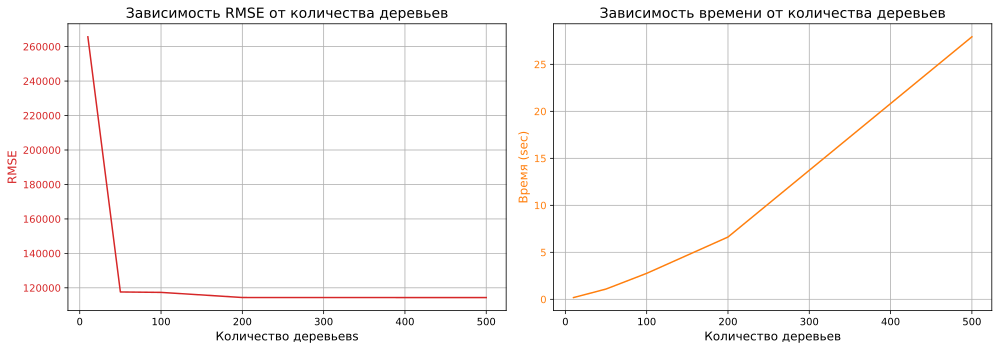

Эксперимент 2: Размерность подвыборки признаков 
 Минимальное RMSE = 114168.357 при времени обучения = 3.351 было достигнуто при подвыборке признаков = 0.5 всех признаков


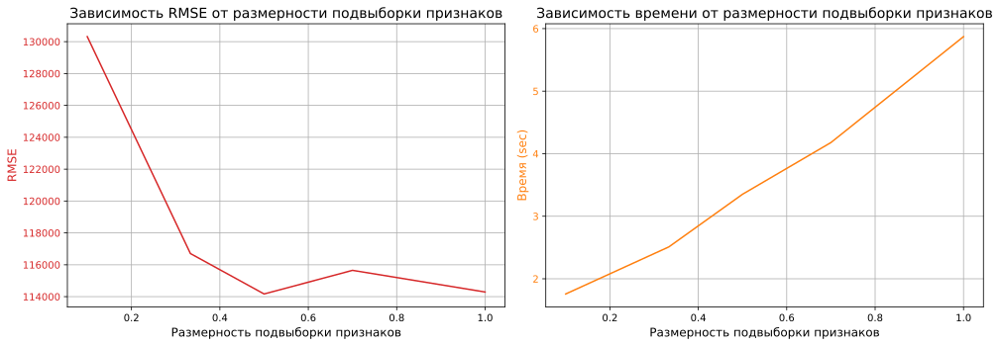

Эксперимент 3: Максимальная глубина дерева 

      Минимальное RMSE = 116730.819 при времени обучения = 4.617 было достигнуто при максимальной глубине дерева = 10 
 
      В случае, когда глубина не ограничена, RMSE = 119772.845 при времени обучения = 119772.845


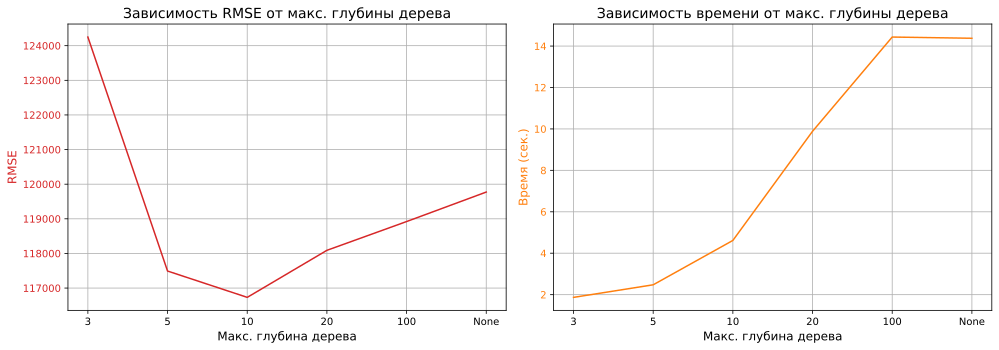

Эксперимент 4: Шаг обучения 
 Минимальное RMSE = 116495.165 при времени обучения = 2.484 было достигнуто при шаге обучения = 0.1


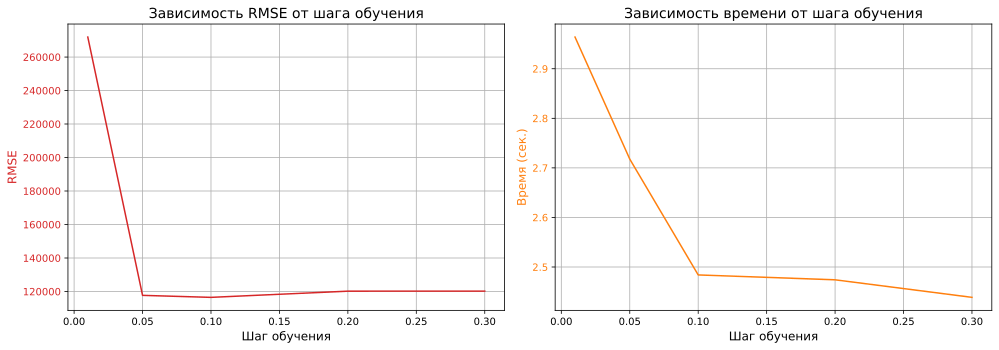

In [504]:
import matplotlib.pyplot as plt

def evaluate_boosting_model(n_estimators, learning_rate, max_features, max_depth, X_train, y_train, X_test, y_test):
    model = GradientBoostingMSE(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        tree_params={'max_depth': max_depth, 'max_features': max_features},
    )

    start_time = time.time()
    model.fit(X_train, y_train, X_test, y_test)
    end_time = time.time()

    predictions = model.predict(X_test, None)
    rmse_val = rmse(y_test, predictions)

    return rmse_val, end_time - start_time


# Эксперимент 1: Количество деревьев
n_estimators_list = [10, 50, 100, 200, 500]
rmse_values_n_estimators = []
times_n_estimators = []

for n_estimators in n_estimators_list:
    rmse_val, elapsed_time = evaluate_boosting_model(n_estimators, 0.1, 1/3, 5, X_train_prep, y_train, X_test_prep, y_test)
    rmse_values_n_estimators.append(rmse_val)
    times_n_estimators.append(elapsed_time)

min_rmse = min(rmse_values_n_estimators)
index_min = rmse_values_n_estimators.index(min_rmse)
time_min = times_n_estimators[index_min]
best_res = n_estimators_list[index_min]

print(f"Эксперимент 1: Количество деревьев \n Минимальное RMSE = {round(min_rmse, 3)} при времени обучения = {round(time_min, 3)} было достигнуто при {best_res} деревьях")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.set_xlabel('Количество деревьевs', fontsize=12)
ax1.set_ylabel('RMSE', color='tab:red', fontsize=12)
ax1.plot(n_estimators_list, rmse_values_n_estimators, color='tab:red', label='RMSE')
ax1.tick_params(axis='y', labelcolor='tab:red')
ax1.set_title('Зависимость RMSE от количества деревьев', fontsize=14)
ax1.grid(True)

ax2.set_xlabel('Количество деревьев', fontsize=12)
ax2.set_ylabel('Время (sec)', color='tab:orange', fontsize=12)
ax2.plot(n_estimators_list, times_n_estimators, color='tab:orange', label='Time')
ax2.tick_params(axis='y', labelcolor='tab:orange')
ax2.set_title('Зависимость времени от количества деревьев', fontsize=14)
ax2.grid(True)

fig.tight_layout()
plt.savefig('3-1.pdf', format='pdf')
plt.show()

# Эксперимент 2: Размерность подвыборки признаков
max_features_ratios = [1/10, 1/3, 1/2, 7/10, 1.0]
rmse_values_max_features = []
times_max_features = []

for ratio in max_features_ratios:
    rmse_val, elapsed_time = evaluate_boosting_model(100, 0.1, ratio, 5, X_train_prep, y_train, X_test_prep, y_test)
    rmse_values_max_features.append(rmse_val)
    times_max_features.append(elapsed_time)

min_rmse = min(rmse_values_max_features)
index_min = rmse_values_max_features.index(min_rmse)
time_min = times_max_features[index_min]
best_res = max_features_ratios[index_min]

print(f"Эксперимент 2: Размерность подвыборки признаков \n Минимальное RMSE = {round(min_rmse, 3)} при времени обучения = {round(time_min, 3)} было достигнуто при подвыборке признаков = {best_res} всех признаков")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.set_xlabel('Размерность подвыборки признаков', fontsize=12)
ax1.set_ylabel('RMSE', color='tab:red', fontsize=12)
ax1.plot(max_features_ratios, rmse_values_max_features, color='tab:red', label='RMSE')
ax1.tick_params(axis='y', labelcolor='tab:red')
ax1.set_title('Зависимость RMSE от размерности подвыборки признаков', fontsize=14)
ax1.grid(True)

ax2.set_xlabel('Размерность подвыборки признаков', fontsize=12)
ax2.set_ylabel('Время (sec)', color='tab:orange', fontsize=12)
ax2.plot(max_features_ratios, times_max_features, color='tab:orange', label='Time')
ax2.tick_params(axis='y', labelcolor='tab:orange')
ax2.set_title('Зависимость времени от размерности подвыборки признаков', fontsize=14)
ax2.grid(True)

fig.tight_layout()
plt.savefig('3-2.pdf', format='pdf')
plt.show()

# Эксперимент 3: Максимальная глубина дерева
max_depth_list = [3, 5, 10, 20, 100, None]
rmse_values_max_depth = []
times_max_depth = []

for max_depth in max_depth_list:
    rmse_val, elapsed_time = evaluate_boosting_model(100, 0.1, 1/3, max_depth, X_train_prep, y_train, X_test_prep, y_test)
    rmse_values_max_depth.append(rmse_val)
    times_max_depth.append(elapsed_time)

min_rmse = min(rmse_values_max_depth)
index_min = rmse_values_max_depth.index(min_rmse)
time_min = times_max_depth[index_min]
best_res = max_depth_list[index_min]
none_res_rmse = rmse_values_max_depth[-1]
none_res_time = rmse_values_max_depth[-1]

print(f'''Эксперимент 3: Максимальная глубина дерева \n
      Минимальное RMSE = {round(min_rmse, 3)} при времени обучения = {round(time_min, 3)} было достигнуто при максимальной глубине дерева = {best_res} \n 
      В случае, когда глубина не ограничена, RMSE = {round(none_res_rmse, 3)} при времени обучения = {round(none_res_time, 3)}''')

max_depth_labels = [str(depth) if depth is not None else "None" for depth in max_depth_list]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.set_xlabel('Макс. глубина дерева', fontsize=12)
ax1.set_ylabel('RMSE', color='tab:red', fontsize=12)
ax1.plot(max_depth_labels, rmse_values_max_depth, color='tab:red', label='RMSE')
ax1.tick_params(axis='y', labelcolor='tab:red')
ax1.set_title('Зависимость RMSE от макс. глубины дерева', fontsize=14)
ax1.grid(True)

ax2.set_xlabel('Макс. глубина дерева', fontsize=12)
ax2.set_ylabel('Время (сек.)', color='tab:orange', fontsize=12)
ax2.plot(max_depth_labels, times_max_depth, color='tab:orange', label='Время')
ax2.tick_params(axis='y', labelcolor='tab:orange')
ax2.set_title('Зависимость времени от макс. глубины дерева', fontsize=14)
ax2.grid(True)

fig.tight_layout()
plt.savefig('3-3.pdf', format='pdf')
plt.show()
                               
# Эксперимент 4: Шаг обучения
learning_rate_list = [0.01, 0.05, 0.1, 0.2, 0.3]
rmse_values_learning_rate = []
times_learning_rate = []

for lr in learning_rate_list:
    rmse_val, elapsed_time = evaluate_boosting_model(100, lr, 1/3, 5, X_train_prep, y_train, X_test_prep
                                                     
                                                     
                                                     
                                                     , y_test)
    rmse_values_learning_rate.append(rmse_val)
    times_learning_rate.append(elapsed_time)

min_rmse = min(rmse_values_learning_rate)
index_min = rmse_values_learning_rate.index(min_rmse)
time_min = times_learning_rate[index_min]
best_res = learning_rate_list[index_min]

print(f"Эксперимент 4: Шаг обучения \n Минимальное RMSE = {round(min_rmse, 3)} при времени обучения = {round(time_min, 3)} было достигнуто при шаге обучения = {best_res}")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.set_xlabel('Шаг обучения', fontsize=12)
ax1.set_ylabel('RMSE', color='tab:red', fontsize=12)
ax1.plot(learning_rate_list, rmse_values_learning_rate, color='tab:red', label='RMSE')
ax1.tick_params(axis='y', labelcolor='tab:red')
ax1.set_title('Зависимость RMSE от шага обучения', fontsize=14)
ax1.grid(True)

ax2.set_xlabel('Шаг обучения', fontsize=12)
ax2.set_ylabel('Время (сек.)', color='tab:orange', fontsize=12)
ax2.plot(learning_rate_list, times_learning_rate, color='tab:orange', label='Время')
ax2.tick_params(axis='y', labelcolor='tab:orange')
ax2.set_title('Зависимость времени от шага обучения', fontsize=14)
ax2.grid(True)

fig.tight_layout()
plt.savefig('3-4.pdf', format='pdf')
plt.show()
